## Load Libraries

In [1]:
import numpy as np
import pandas as pd
import scipy.signal
from scipy.stats import logistic
import matplotlib.pyplot as plt
from datetime import timedelta
from scipy.integrate import simpson
from scipy import stats
import statsmodels.api as sm
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from fdasrsf.regression import elastic_regression
from fdasrsf.utility_functions import elastic_distance
import fdasrsf as fs
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

import warnings
warnings.filterwarnings('ignore')

In [2]:
# ys = np.load('all_knock.npy')[:,:,1]
# pids = np.loadtxt('pids_knock.txt')
# visits = np.loadtxt('visits_knock.txt', dtype=str)

ys = np.loadtxt('ys_knock_wodelta.txt')
pids = np.loadtxt('pids_knock_wodelta.txt')
visits = np.loadtxt('visits_knock_wodelta.txt', dtype=str)

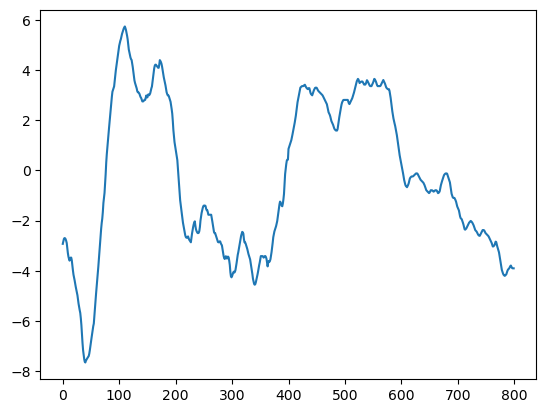

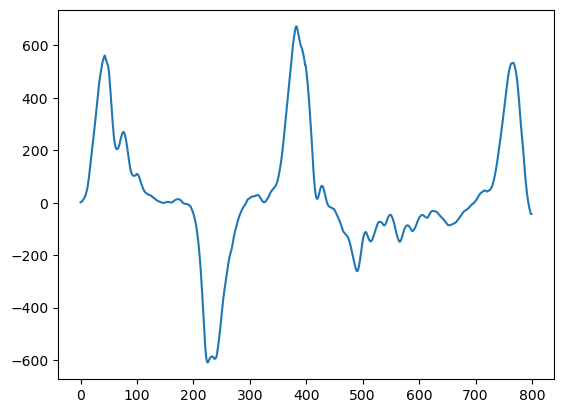

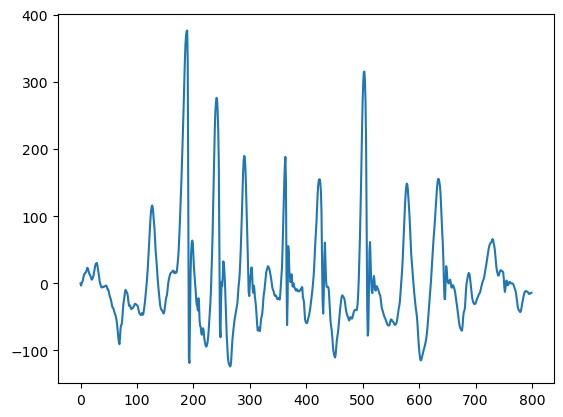

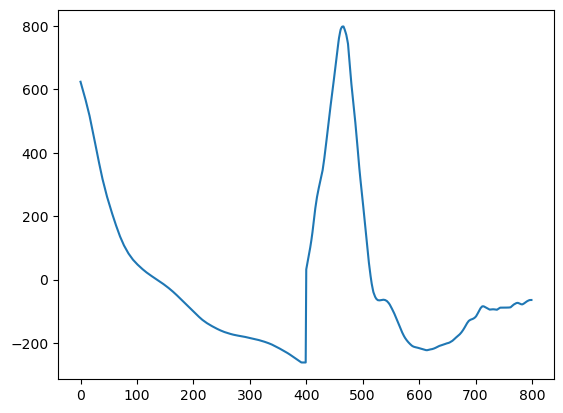

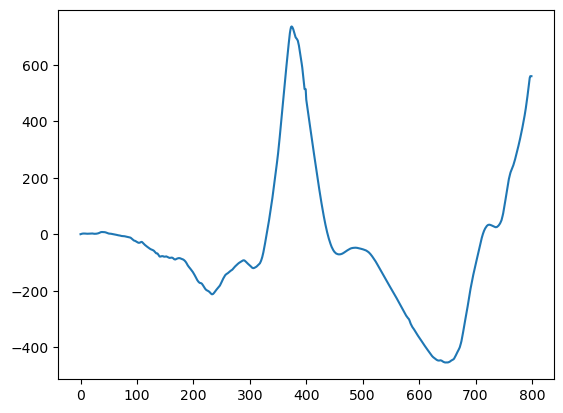

...

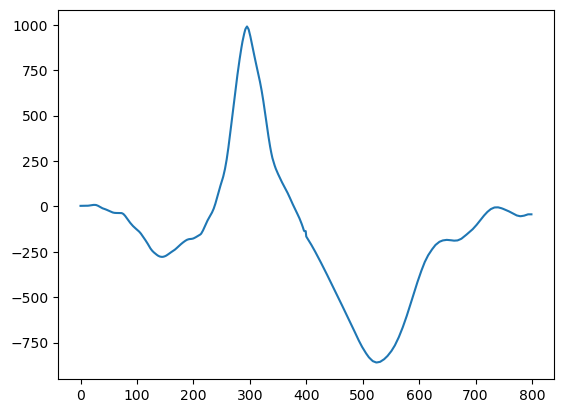

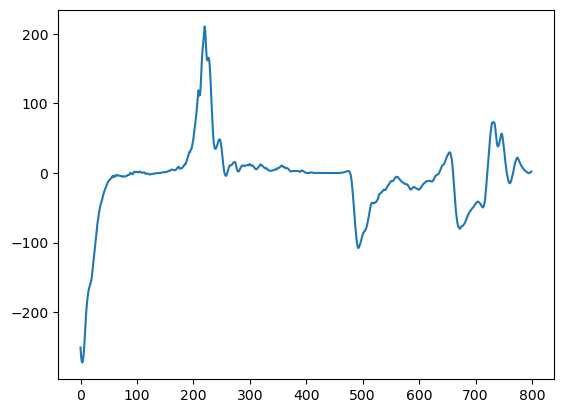

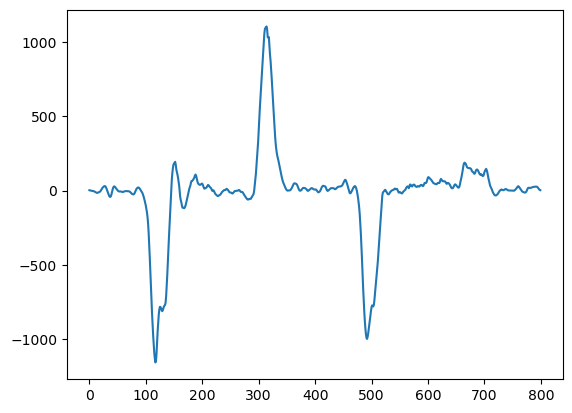

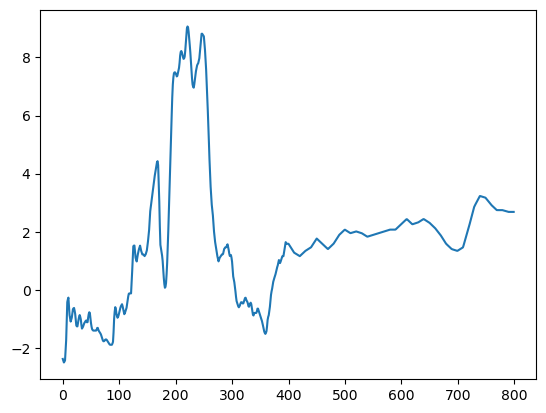

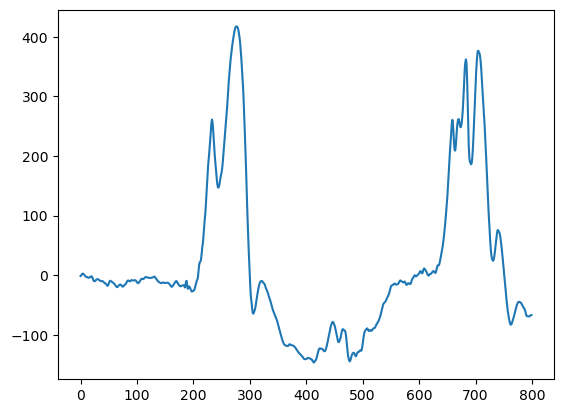

In [3]:
newys = []
newpids = []
newvisits = []

for i in range(0, len(ys), 2):
    ysarray = np.array(ys)
    newys.append(np.concatenate((ysarray[i, :], ysarray[i+1, :])))
    newpids.append(pids[i])
    newvisits.append(visits[i])

for i in range(len(newys)):
    plt.figure()
    plt.plot(newys[i])

## Loading Data

In [4]:
ys = newys
pids = newpids
visits = newvisits

df_processor = pd.DataFrame(ys)
df_processor['pids']=pids
df_processor['visits']=visits

baseline_df = pd.read_csv('/mnt/sdb/arafat/U-Extend/paper_data/final_clinical_df.csv')
baseline_df = baseline_df.drop(columns=['Dom','Gender'])

baseline_df['Normalized_Dynamometry (N/cm)'] = baseline_df['Avg. Dynamometry (N)'] / baseline_df['Forearm_Length (cm)']
baseline_df['Normalized Elbow Torque (Nm/cm)'] = baseline_df['Elbow Torque (Nm)'] / baseline_df['Forearm_Length (cm)']

df_processor['visits'] = pd.to_datetime(df_processor['visits'])
df_processor['visits'] = df_processor['visits'].apply(lambda x: x.strftime('%Y-%m-%d'))
df_processor['visits'] = pd.to_datetime(df_processor['visits'], format = "%Y-%m-%d")

baseline_df['Sensor Data Date'] = pd.to_datetime(baseline_df['Sensor Data Date'], format = "%Y-%m-%d")
df_processor = pd.merge(df_processor, baseline_df, left_on=['pids','visits'], right_on=['PID','Sensor Data Date'], how='inner')

In [5]:
def random_sample(group):
    return group.sample(n=1)

In [6]:
random_rows = df_processor.groupby(['pids']).apply(random_sample).reset_index(drop=True)
ys = random_rows.iloc[:,0:800].values
ys.shape

(29, 800)

## FPCA without shape alignment

In [7]:
# import skfda
# from skfda.datasets import fetch_growth
# from skfda.exploratory.visualization import FPCAPlot
# from skfda.preprocessing.dim_reduction.feature_extraction import FPCA
# from skfda.representation.basis import BSpline, Fourier, Monomial

In [8]:
# grid_points = list(range(800))  # Grid points of the curves
# data_matrix = ys
# fd = skfda.FDataGrid(
#     data_matrix=data_matrix,
#     grid_points=grid_points,
# )

# fd.plot()

In [9]:
# fpca_discretized = FPCA(n_components=3)
# fpca_discretized.fit(fd)
# fpca_discretized.components_.plot()

In [10]:
# all_components = fpca_discretized.components_.data_matrix.squeeze()

def functional_pca(ys):
    mean = ys.mean(axis=0)
    ys_mean_centered = ys - mean
    U, sigma, V_t = np.linalg.svd(ys_mean_centered, full_matrices=False)
    eigenvecs = V_t[:3,:]
    pc_cords = U[:,:3] @ np.diag(sigma[0:3])
    stds = np.std(pc_cords, axis=0)
    return mean, eigenvecs, pc_cords, stds, U[:,:3]

In [11]:
# new_transformdata = fpca_discretized.transform(fd)

mean, eigenvecs, pc_cords, stds, U = functional_pca(ys)
print(mean.shape, eigenvecs.shape, pc_cords.shape, U.shape, stds.shape)

(800,) (3, 800) (29, 3) (29, 3) (3,)


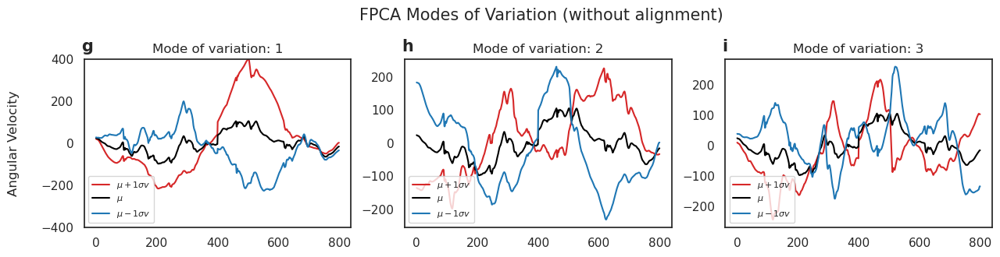

In [12]:
sns.set(font_scale=1)
sns.set(style='white')

def eigen_plotting(mean, eigenvecs, stds):

    fig, axs = plt.subplots(1,3, figsize=(15, 3))
    labels = ['g', 'h', 'i']
    
    for i in range(3):
      ax = axs[i]
      ax.set_title('Mode of variation: {}'.format(i+1), fontsize=12)
      eigenvec = eigenvecs[i,:]
        
      ax.plot(mean+1*stds[i]*eigenvec, label=r'$\mu + 1 \sigma v$', color='tab:red')  
      ax.plot(mean+0*stds[i]*eigenvec, label=r'$\mu$', color='black')    
      ax.plot(mean-1*stds[i]*eigenvec, label=r'$\mu - 1 \sigma v$', color='tab:blue')
      ax.text(-0.01, 1.12, labels[i], transform=ax.transAxes, fontsize=15, 
                verticalalignment='top', fontweight='bold')
      ax.legend(loc='lower left', fontsize=8)
    
    axs[0].set_ylim([-400, 400])
    
    plt.subplots_adjust(top=0.83)
    plt.suptitle('FPCA Modes of Variation (without alignment)', fontsize=15, y=1.05, x=0.515)
    fig.text(0.06, 0.47, 'Angular Velocity', va='center', rotation='vertical', fontsize=12)
    
    plt.savefig('pics/FPCA_wa.png', dpi=300, bbox_inches='tight')

eigen_plotting(mean, eigenvecs, stds)

In [13]:
# newdf = pd.DataFrame(new_transformdata)
# newdf.columns = ['vpc1_knock', 'vpc2_knock','vpc3_knock']
# newdf = pd.concat([df_processor, newdf], axis =1)
# newdf

In [14]:
# newdf = newdf.groupby(['PID']).agg({'Age':'mean',
#                                     'Forearm_Length (cm)':'mean',
#                                     'CSA (cm^2)':'mean',
#                                     'Avg_Echo':'mean',
#                                     'Normalized Elbow Torque (Nm/cm)':'mean',
#                                     'vpc1_knock':'mean',
#                                     'vpc2_knock':'mean',
#                                     'vpc3_knock':'mean',
#                                     'Brooke':'mean',
#                                     'Cohort':'first',
#                                     'PID':'first'})

In [15]:
# newdf

In [16]:
# newdf.to_csv('knock_vpc_noalign.csv', index=False)

## FPCA Multi

In [17]:
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt

import skfda
from skfda.datasets import fetch_growth
from skfda.exploratory.visualization import FPCAPlot
from skfda.preprocessing.dim_reduction.feature_extraction import FPCA
from skfda.representation.basis import BSpline, Fourier, Monomial

fpcas = []

trials = 100

for trial in tqdm(range(trials)):

    # Then apply the function to each group defined by 'pid' and the sampled 'visit' to randomly sample based on 'trial'
    random_rows = df_processor.groupby(['pids']).apply(random_sample).reset_index(drop=True)
    ys = random_rows.iloc[:,0:800].values
    demo_data = random_rows.iloc[:,800:]
    mean, eigenvecs, pc_cords, stds, U = functional_pca(ys)
    fpcas.append((eigenvecs, pc_cords, U, mean, stds, demo_data))

  0%|          | 0/100 [00:00<?, ?it/s]

In [18]:
#Fix sign ambiguity
ref = 0
V_ref = fpcas[0][0]

for trial in range(trials):
  for dim in range(V_ref.shape[0]):
    corr_pc = np.dot(fpcas[trial][0][dim, :], fpcas[ref][0][dim, :]) # pick eigenfunction
      
    if corr_pc < 0:
        fpcas[trial][0][dim, :] = -fpcas[trial][0][dim, :]
        fpcas[trial][1][:, dim] = -fpcas[trial][1][:, dim]

  0%|          | 0/100 [00:00<?, ?it/s]

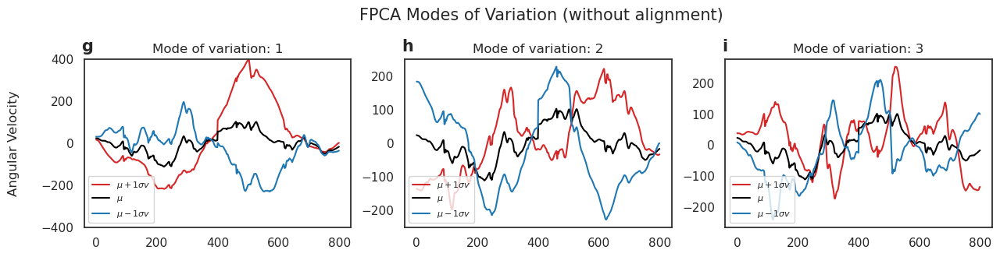

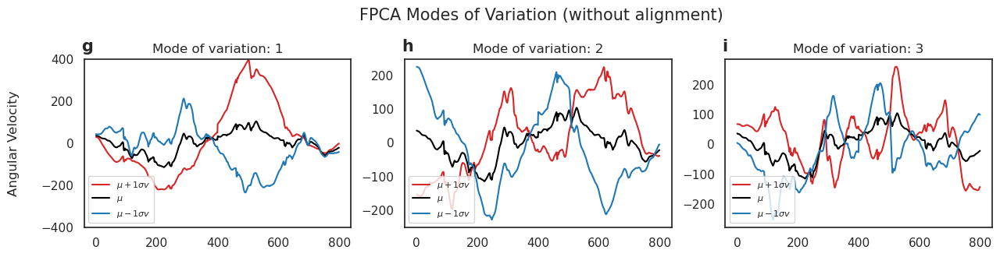

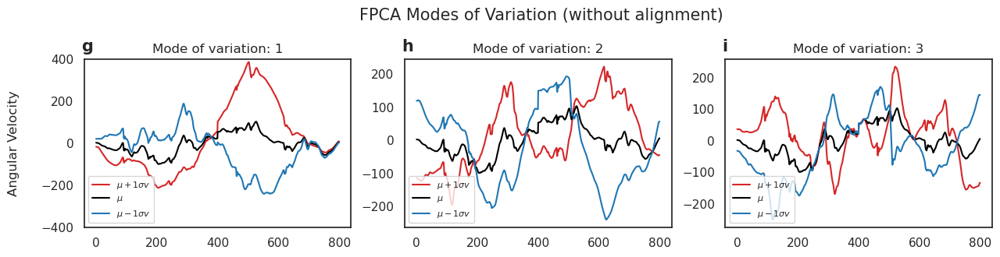

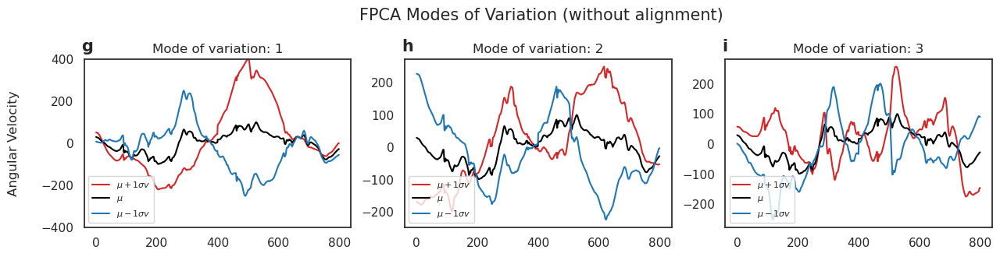

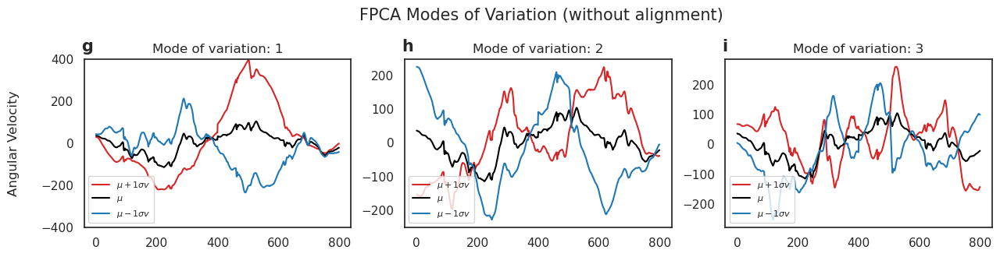

...

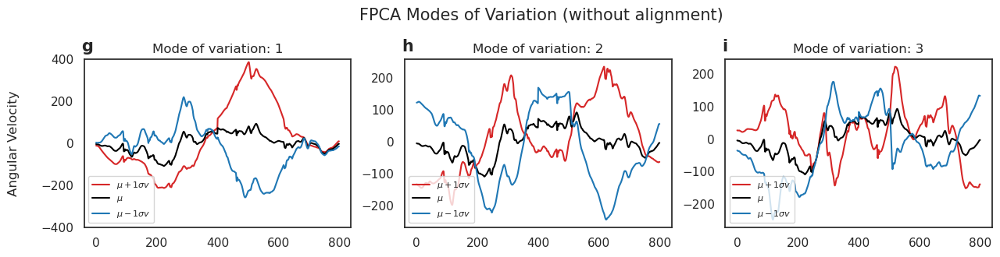

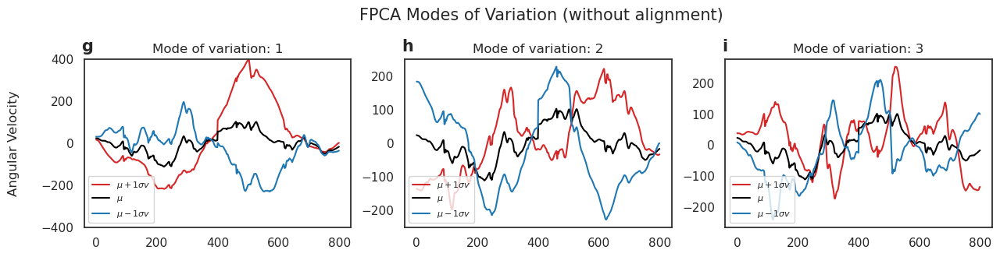

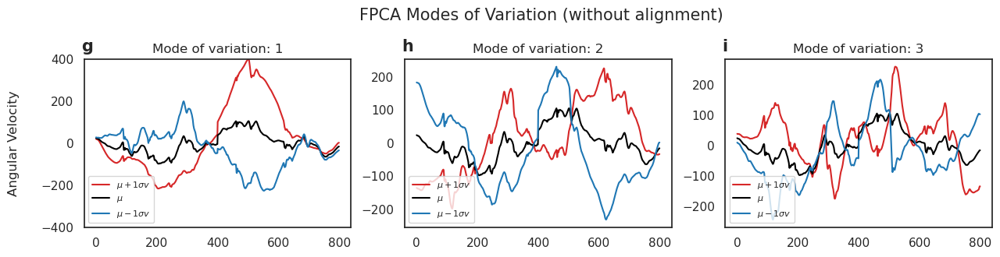

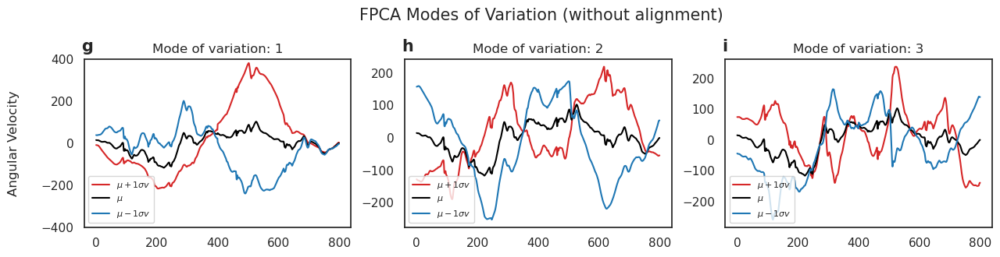

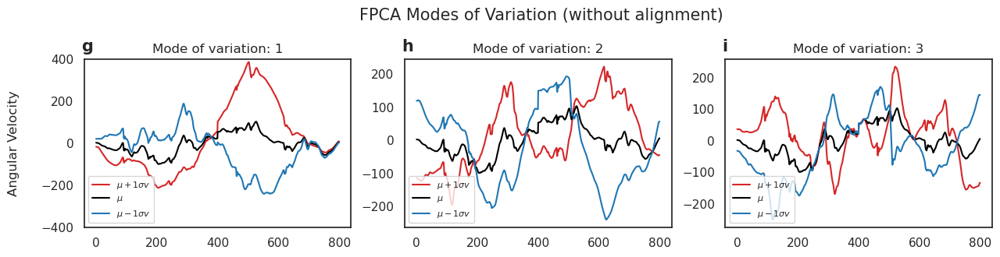

In [19]:
for trial in tqdm(range(trials)):
    mean = fpcas[trial][3]
    eigenvecs = fpcas[trial][0]
    stds = fpcas[trial][4]
    eigen_plotting(mean, eigenvecs, stds)

In [20]:
fpca_dfs = []

for trial in tqdm(range(trials)):
    fpc_score = pd.DataFrame(fpcas[trial][1], columns = ['vpc1_knock', 'vpc2_knock','vpc3_knock'])
    cd = pd.concat([fpc_score, fpcas[trial][5]], axis =1)
    fpca_dfs.append(cd)

  0%|          | 0/100 [00:00<?, ?it/s]

In [21]:
# Separate numeric and non-numeric data
numeric_dfs = [df.select_dtypes(include='number') for df in fpca_dfs]
non_numeric_df = fpca_dfs[0].select_dtypes(exclude='number')

# Calculate the mean of numeric data
numeric_mean_df = sum(numeric_dfs) / len(numeric_dfs)

# Combine numeric mean with non-numeric data from the first DataFrame
mean_df = numeric_mean_df.join(non_numeric_df)
mean_df

,vpc1_knock,vpc2_knock,vpc3_knock,pids,PID,Visit #,Age,Forearm_Length (cm),CSA (cm^2),Normalized_CSA (cm^2/cm),...,MIP pred,MIP pre,MIP % pred (pre),Normalized_Dynamometry (N/cm),visits,Sensor Data Date,Cohort,DTW,LCSS,DEXA Date
0,-1215.358734,-1220.877241,92.324945,1.0,1.0,1.50,10.0,19.50,3.285000,0.221223,...,NaN,NaN,NaN,0.746364,2021-07-08,2021-07-08,DMD,0.0965,0.9755,NaN
1,-988.499135,157.716314,393.760719,2.0,2.0,1.00,12.0,24.00,7.590000,0.316250,...,-128.0,-26.0,20.0,0.295930,2021-02-11,2021-02-11,DMD,0.1708,0.972,NaN
2,-44.727316,-4782.473212,-1866.136445,3.0,3.0,1.46,15.0,22.73,1.960200,0.086280,...,NaN,NaN,NaN,0.621826,2021-02-24,2021-02-24,SMA,0.0682,0.984,NaN
3,-1146.180296,307.654672,107.276739,5.0,5.0,1.00,28.0,24.00,8.150000,0.339583,...,-125.0,-123.0,98.0,NaN,2021-03-11,2021-03-11,DMD,0.2767,0.972,NaN
4,-2262.068982,-1249.712882,-62.142212,8.0,8.0,1.00,6.0,21.00,7.010000,0.333810,...,NaN,NaN,NaN,1.394623,2021-04-21,2021-04-21,Healthy,0.1114,1,NaN
5,-738.829932,65.432457,185.171306,10.0,10.0,1.00,2.0,14.00,2.060000,0.147143,...,NaN,NaN,NaN,NaN,2021-03-24,2021-03-24,SMA,0.3067,0.897,NaN
6,-1620.925648,2167.173339,-154.932946,11.0,11.0,1.50,6.0,18.00,2.465000,0.136945,...,NaN,NaN,NaN,NaN,2021-03-24,2021-03-24,DMD,0.2697,0.934,NaN
7,-481.055414,-1097.815867,566.331252,12.0,12.0,1.52,33.0,22.28,NaN,NaN,...,NaN,NaN,NaN,NaN,2021-04-28,2021-04-28,DMD,0.0964,0.981,NaN
8,-152.055427,125.327899,393.555904,14.0,14.0,1.00,15.0,23.00,2.401287,0.104404,...,NaN,NaN,NaN,0.878040,2021-04-28,2021-04-28,DMD,0.1553,0.967,2021-04-28
9,-515.067404,1257.930959,69.386831,15.0,15.0,1.00,7.0,19.00,3.120000,0.164211,...,NaN,NaN,NaN,0.333851,2021-05-13,2021-05-13,SMA,0.2123,0.955,NaN


In [22]:
mean_df.to_csv('fpca_multi_knock.csv',index=False)